### Double (and more) Pendulum 
For this part of the final, I am going to be creating code that simulates Taylor Section 11.4 which doesn't assume the small angle approximation. This has multiple parts that I will accomplish and document as I go through this problem. 

1. This notebook will be solving for the double pendulum case and I will create a Python class for the
    double pendulum. It can use either Euler-Lagrange or Hamiltonian equations and I am choosing to use
    Euler-Lagrange as I am more comfortable with these equations. 
2. There will be outputs of graphs for the solutions of the two angles as a function of time. 
3. After these graphs, I will change the initial conditions to be larger than that of a small angle
    approximation and will show that that the system is chaotic. 
4. After this I will attempt to animate the pendulum to show how the system would look physically
    
Now I attempt to go through these steps and complete them all! 

### Part 1: Solve the double pendulum case with Euler-Lagrange 

In [1]:
%matplotlib inline 

import numpy as np #for numpy functions
from scipy.integrate import solve_ivp #to be able to solve ivp problems
import matplotlib.pyplot as plt #for plotting
from IPython.display import Image

Setting our coventions and notation for the double pendulum using the Wikipedia article. The origin is where the pendulum is attached to the ceiling and x_hat pointing to the right and y_hat pointing down

In [2]:
Image(url='https://upload.wikimedia.org/wikipedia/commons/7/78/Double-Pendulum.svg')

In [3]:
class doublepen():
    """ 
    doublepen class is a class that will have the parameters needed to solve Euler-Lagrange equations for a 
    double pendulum 
    
    There are 4 initial parameters that need to be given in order to solve these problems them being: 
    L1: the length of 1st pendulum
    L2: length of 2nd pendulum 
    g: gravitational accel from Earth 
    mn: mass of the pendulum blob and n is the blob number 
    
    Will be using similar dy_dt function that has been used in other problem sets to solve the ivp which will
    return the rhs of the different equation. 
    
    There will also be a modified solve_ode that was also used in previous problem sets. 
    
    A new total energy function that was provided in video was used to return the total energy of the system
    """
    def __init__(self, L1=1., L2=1., mass1=1., mass2=1., g=1.):
        """
        init function initializes the class to contain all the given information to be called
        """
        self.L1 = L1 
        self.L2 = L2
        self.m1 = mass1 
        self.m2 = mass2 
        self.g = g 
        
    def dy_dt(self, t, y):
        """
        returns rhs of differential equation give t and y 
        """
        #initializing theta1,2 and z1,2 to equal y
        th1, z1, th2, z2 = y 
        
        #setting functions to be able to call cosines and sines easier c is cos s is sin
        c = np.cos(th1 - th2)
        s = np.sin(th1 - th2)
        
        #setting theta1dot equal to z1 
        th1_dot = z1 
        #setting z1_dot equal to the given equation 
        z1_dot = (self.m2 * self.g * np.sin(th2) * c - self.m2 * s * (self.L1 * z1**2 * c + self.L2 * z2**2) \
                    - (self.m1 + self.m2) * self.g * np.sin(th1) ) / self.L1 / (self.m1 + self.m2 * s**2)
        #setting theta2_dot
        th2_dot = z2 
        #setting z2_dot
        z2_dot = ( (self.m1 + self.m2) * (self.L1 * z1**2 * s - self.g * np.sin(th2) + self.g * np.sin(th1) \
                    * c) + self.m2 *self.L2 * z2**2 * s * c ) / self.L2 / (self.m1 +self.m2 * s**2) 
        #returning these functions 
        return th1_dot, z1_dot, th2_dot, z2_dot
    
    def solve_ode(self, t_pts, th1_0, th1_dot_0, th2_0, th2_dot_0, abserr=1.0e-10, relerr=1.0e-10):
        """
        solving the ODE for the given IVP 
        """
        #setting y
        y = [th1_0, th1_dot_0, th2_0, th2_dot_0]
        #solving for solution 
        solution = solve_ivp(self.dy_dt, (t_pts[0],t_pts[-1]), y, t_eval=t_pts, atol=abserr, rtol=relerr)
        #setting the returned values to what solution gives
        th1, th1_dot, th2, th2_dot = solution.y 
        #returning these solutions 
        return th1, th1_dot, th2, th2_dot
    
    def calc_E(y): 
        """
        returns the total energy of system solving for both potential and kinetic and adding together
        """
        #setting y
        th1, th1_dot, th2, th2_dot = y.T
        #solving for V
        V = -(self.m1 + self.m2) * self.L1 * self.g * np.cos(th1) - self.m2 * self.L2 * self.g * np.cos(th2)
        #sovling for T
        T = 0.5 * self.m1 (self.L1 * th1_dot)**2. + 0.5 * self.m2 * ((self.L1 * th1_dot)**2 + (self.L2 * th2_dot)**2
            + 2 * self.L1 * self.L2 * th1_dot * th2_dot *np.cos(th1 - th2))
        #returning 
        return T + V

### Part 2: Show Graphs of two angles as a function of time 

In [4]:
def plot_y_vs_x(x, y, axis_labels=None, label=None, title=None, 
                color=None, linestyle=None, semilogy=False, loglog=False,
                ax=None):
    """
    Generic plotting function: return a figure axis with a plot of y vs. x,
    with line color and style, title, axis labels, and line label
    """
    if ax is None:        # if the axis object doesn't exist, make one
        ax = plt.gca()

    if (semilogy):
        line, = ax.semilogy(x, y, label=label, 
                            color=color, linestyle=linestyle)
    elif (loglog):
        line, = ax.loglog(x, y, label=label, 
                          color=color, linestyle=linestyle)
    else:
        line, = ax.plot(x, y, label=label, 
                    color=color, linestyle=linestyle)

    if label is not None:    # if a label if passed, show the legend
        ax.legend()
    if title is not None:    # set a title if one if passed
        ax.set_title(title)
    if axis_labels is not None:  # set x-axis and y-axis labels if passed  
        ax.set_xlabel(axis_labels[0])
        ax.set_ylabel(axis_labels[1])

    return ax, line

In [5]:
#defining function for start and stop indicies (given in previous problem sets)
def start_stop_indices(t_pts, plot_start, plot_stop):
    start_index = (np.fabs(t_pts-plot_start)).argmin()
    stop_index = (np.fabs(t_pts-plot_stop)).argmin()
    return start_index, stop_index

In [6]:
#Now time for actual plotting!

#setting the labels for graphs 
th_vs_time_labels = (r'$t$', r'$\theta(t)$')

#setting plotting time 
t_start = 0.
t_end = 500. 
delta_t = 0.01

t_pts = np.arange(t_start, t_end+delta_t, delta_t)

L1 = 1. 
L2 = 1.
mass1 = 1. 
mass2 = 1. 
g=1. 

#creating double pendulum 
dp = doublepen(L1=L1, L2=L2, mass1=mass1, mass2=mass2, g=g)

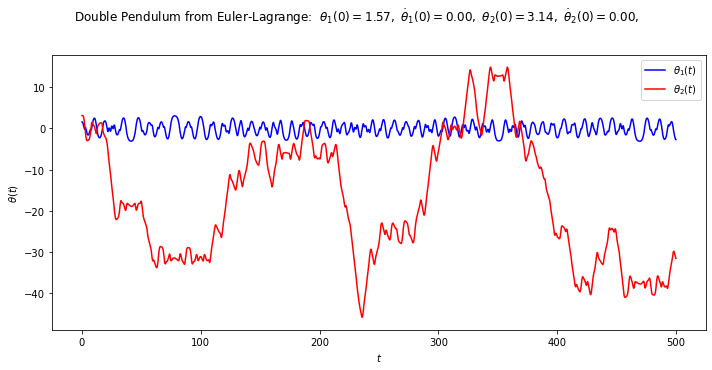

In [7]:
th1_0 = np.pi / 2. 
th1_dot_0 = 0.
th2_0 = np.pi 
th2_dot_0 = 0.

th1, th_dot, th2, th2_dot = dp.solve_ode(t_pts, th1_0, th1_dot_0, th2_0, th2_dot_0)

#starting plot 
fig = plt.figure(figsize=(10,5))
overall_title = 'Double Pendulum from Euler-Lagrange: ' + rf' $\theta_1(0) = {th1_0:.2f},$' \
                    + rf' $\dot\theta_1(0) = {th1_dot_0:.2f},$' + rf' $\theta_2(0) = {th2_0:.2f},$' \
                    + rf' $\dot\theta_2(0) = {th2_dot_0:.2f},$'
fig.suptitle(overall_title, va='baseline')

ax_a = fig.add_subplot(1,1,1)

start, stop = start_stop_indices(t_pts, t_start, t_end)
plot_y_vs_x(t_pts[start : stop], th1[start:stop],
           axis_labels=th_vs_time_labels, 
           color='blue',
           label=r'$\theta_1(t)$',
           ax=ax_a)
plot_y_vs_x(t_pts[start : stop], th2[start : stop],
           color='red',
           label=r'$\theta_2(t)$',
           ax=ax_a)

fig.tight_layout()
fig.savefig('doublependulum1.png', bbox_inches='tight')

### Part 3: Change initial opinions to show that it becomes chaotic

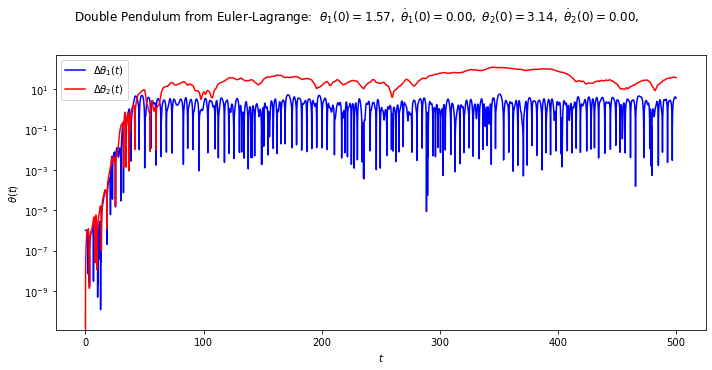

In [8]:
#initial conditions
th1_0 = np.pi / 2.
th1_dot_0 = 0. 
th2_0 = np.pi 
th2_dot_0 = 0.

#plugging in two slight different initial values
th1, th1_dot, th2, th2_dot = dp.solve_ode(t_pts, th1_0, th1_dot_0, th2_0, th2_dot_0)
th1b, th1b_dot, th2b, th2b_dot = dp.solve_ode(t_pts, th1_0 - .000001, th1_dot_0, th2_0, th2_dot_0)

#plotting! 
fig = plt.figure(figsize=(10,5))
overall_title = 'Double Pendulum from Euler-Lagrange: ' + rf' $\theta_1(0) = {th1_0:.2f},$' \
                    + rf' $\dot\theta_1(0) = {th1_dot_0:.2f},$' + rf' $\theta_2(0) = {th2_0:.2f},$' \
                    + rf' $\dot\theta_2(0) = {th2_dot_0:.2f},$'
fig.suptitle(overall_title, va='baseline')

ax_a = fig.add_subplot(1,1,1)

start, stop = start_stop_indices(t_pts, t_start, t_end)
plot_y_vs_x(t_pts[start : stop],np.abs(th1[start : stop] - th1b[start : stop]),
           axis_labels=th_vs_time_labels, 
           color='blue', semilogy=True,
           label=r'$\Delta\theta_1(t)$',
           ax=ax_a)
plot_y_vs_x(t_pts[start : stop], np.abs(th2[start : stop] - th2b[start : stop]),
           color='red', semilogy=True,
           label=r'$\Delta\theta_2(t)$',
           ax=ax_a)

fig.tight_layout()
fig.savefig('doublependulum1.png', bbox_inches='tight')

### Part 4: Widget it

In [9]:
from matplotlib import animation, rc 
from IPython.display import HTML 

In [10]:
def xy_coords (x0, y0, th, L):
    """
    converts theta and pendulum length L to a position with respect to (x0,y0)
    """
    x = x0 + L * np.sin(th)
    y = y0 - L * np.cos(th)
    return x, y

In [11]:
%%capture 
x_min = -3.2 
x_max = -x_min
y_min = -3.2
y_max = -y_min

fig_anim = plt.figure(figsize=(5,5), num='Double Pendulum')
ax_anim = fig_anim.add_subplot(1,1,1)
ax_anim.set_xlim(x_min, x_max)
ax_anim.set_ylim(y_min, y_max)


x0, y0 = 0., 0. 
pt0_anim, = ax_anim.plot(x0, y0,'o', markersize=6, color='black')

#first pendulum 
x1, y1 = xy_coords(x0, y0, th1[0], dp.L1)
pt1_anim, = ax_anim.plot(x1, y1,'o', markersize=12,color='blue')
ln1_anim, = ax_anim.plot([x0, x1], [y0,y1], color='blue',lw=3)
x2,y2 = xy_coords(x1,y1, th2[0], dp.L2)
pt2_anim, = ax_anim.plot(x2, y2, 'o', markersize=12,color='blue')
ln2_anim, = ax_anim.plot([x1,x2],[y1,y2], color = 'blue', lw=3)

#second pendulum to show chaos
x1b, y1b = xy_coords(x0, y0, th1b[0], dp.L1)
pt1b_anim, = ax_anim.plot(x1b, y1b,
                       'o', markersize=12,
                       color='red')
ln1b_anim, = ax_anim.plot([x0, x1b], [y0,y1b], color='red',lw=3)
x2b,y2b = xy_coords(x1b,y1b, th2b[0], dp.L2)
pt2b_anim, = ax_anim.plot(x2b, y2b,
                       'o', markersize=12,
                       color='red')
ln2b_anim, = ax_anim.plot([x1b,x2b],[y1b,y2b], color = 'red', lw=3)

ax_anim.set_aspect(1)
ax_anim.axis('off')
fig_anim.tight_layout()

In [12]:
def animate_pendulum(i):
    """
    this function creates each frame with an index i 
    """
    i_skip = 2 * i 
    
    x0, y0 = 0., 0. 
    pt0_anim.set_data(x0, y0)
    
    x1,y1 = xy_coords(x0, y0, th1[i_skip], dp.L1)
    pt1_anim.set_data(x1, y1)
    ln1_anim.set_data([x0, x1], [y0, y1])
    x2, y2 = xy_coords(x1, y1, th2[i_skip], dp.L2)
    pt2_anim.set_data(x2, y2)
    ln2_anim.set_data([x1, x2], [y1, y2])
    
    x1b,y1b = xy_coords(x0, y0, th1b[i_skip], dp.L1)
    pt1b_anim.set_data(x1b, y1b)
    ln1b_anim.set_data([x0, x1b], [y0, y1b])
    x2b, y2b = xy_coords(x1b, y1b, th2b[i_skip], dp.L2)
    pt2b_anim.set_data(x2b, y2b)
    ln2b_anim.set_data([x1b, x2b], [y1b, y2b])
    
    return (pt0_anim, pt1_anim, ln1_anim, pt2_anim, ln2_anim, pt1b_anim, ln1b_anim, pt2b_anim, ln2b_anim)

In [13]:
frame_interval = 1.
frame_number = 2001
anim = animation.FuncAnimation(fig_anim,
                              animate_pendulum,
                              init_func=None,
                              frames=frame_number,
                              interval=frame_interval,
                              blit=True,
                              repeat=False)

In [14]:
HTML(anim.to_jshtml())